# Задание

1. Сгенерируйте цифры набора MNIST с преобученной моделью Condition GAN
2. Сгенерируйте изображение с предобученной моделью https://github.com/NVlabs/stylegan
3. https://arxiv.org/pdf/1910.11626.pdf

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

In [ ]:
# Add access to Google Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor,
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [ ]:
import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    return F.one_hot(labels, num_classes=n_classes)

In [ ]:
mnist_shape = (1, 28, 28)
n_classes = 10

criterion = nn.BCEWithLogitsLoss()
n_epochs = 50
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

In [ ]:
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns:
        generator_input_dim: the input dimensionality of the conditional generator,
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    return generator_input_dim, discriminator_im_chan

In [ ]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/469 [00:00<?, ?it/s]

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!


  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 2.0887087086439133, discriminator loss: 0.2700863086842


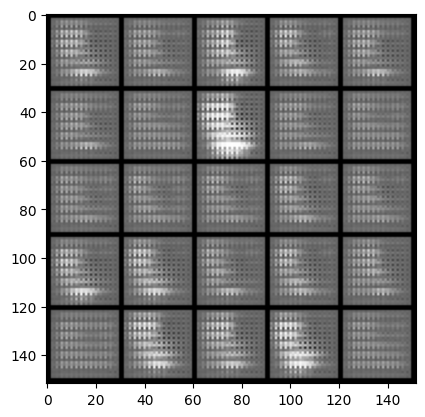

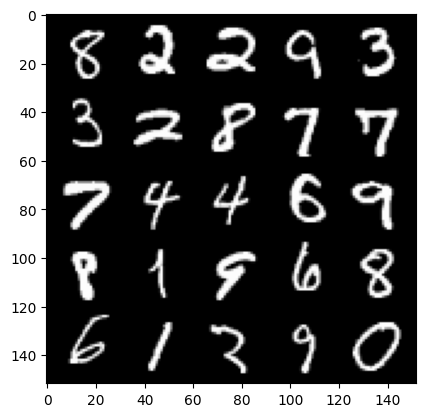

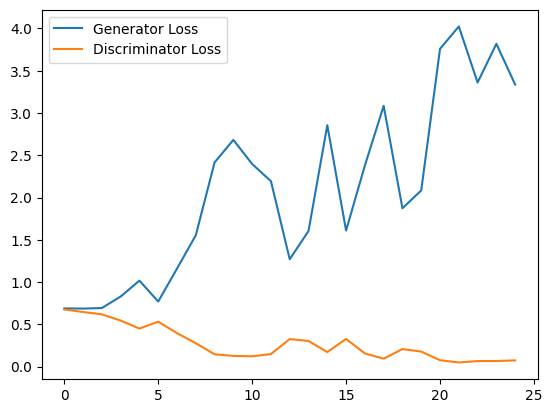

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 4.498078378200531, discriminator loss: 0.053179879560135306


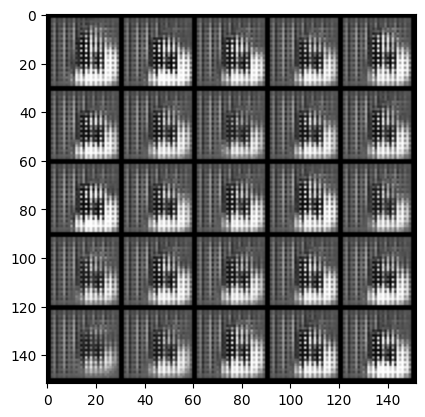

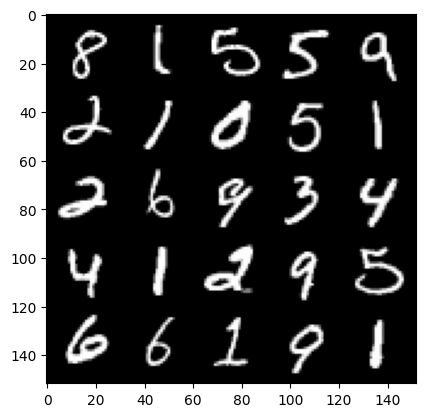

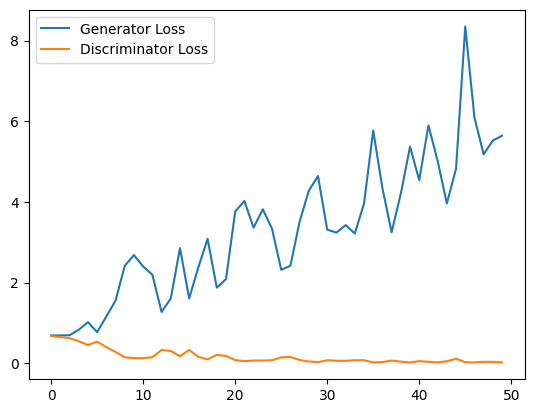

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 4.449655331611633, discriminator loss: 0.056268484042026105


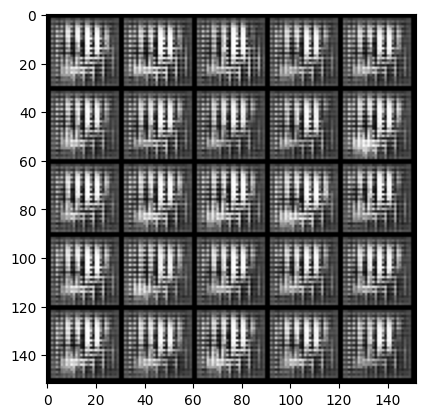

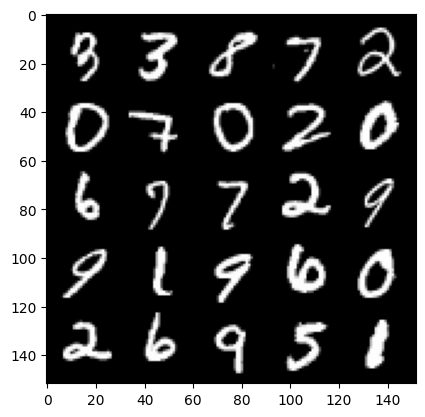

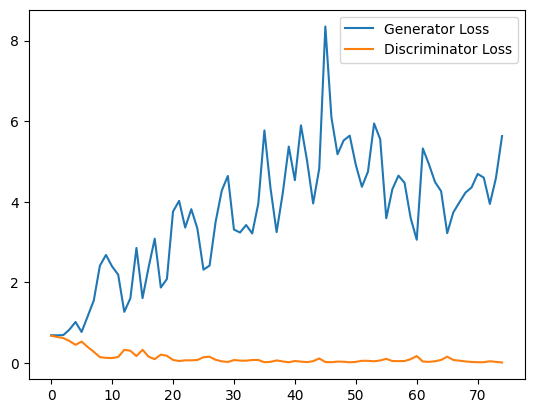

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 5.308896367549896, discriminator loss: 0.021619675730820746


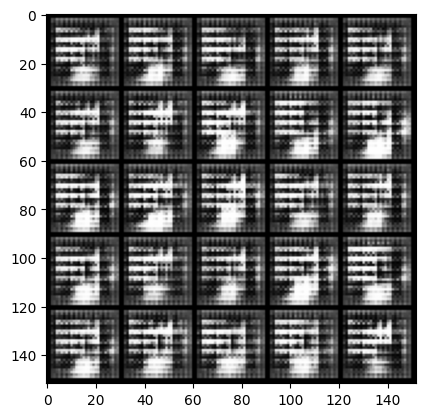

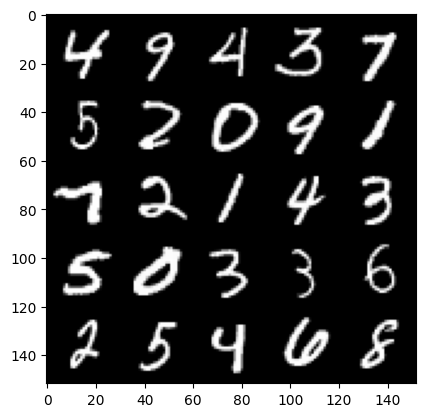

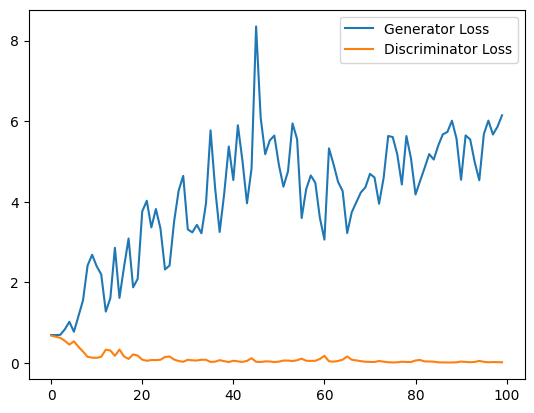

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 4.798190671920777, discriminator loss: 0.0372308688107878


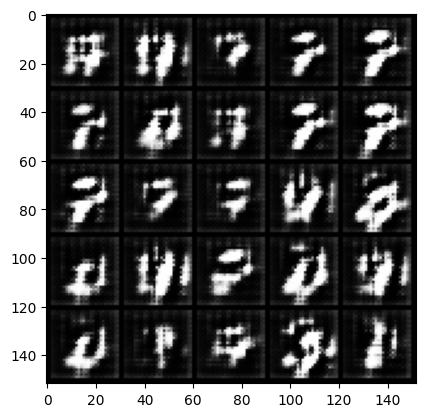

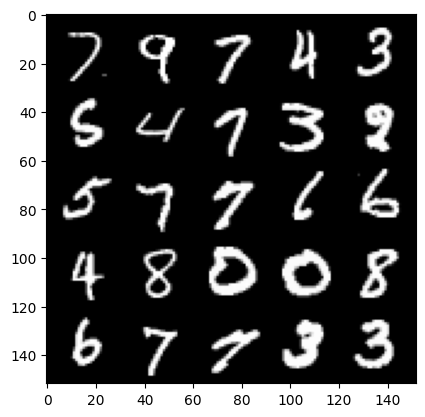

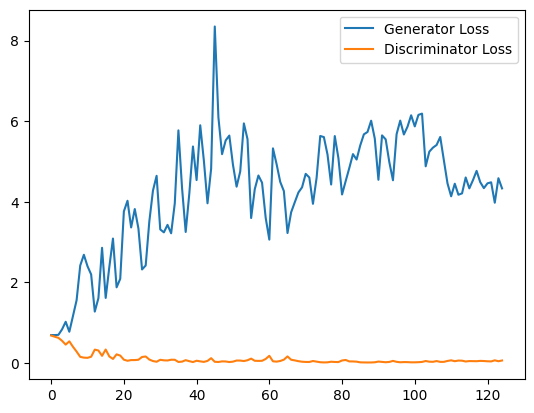

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 3.427687269926071, discriminator loss: 0.14150880324095488


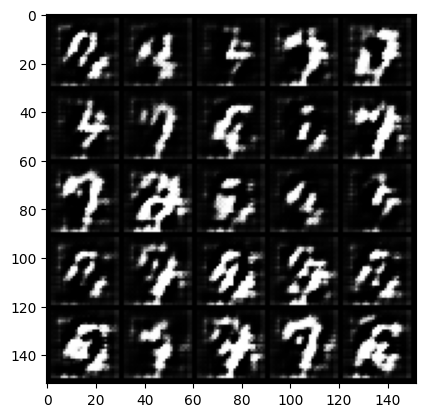

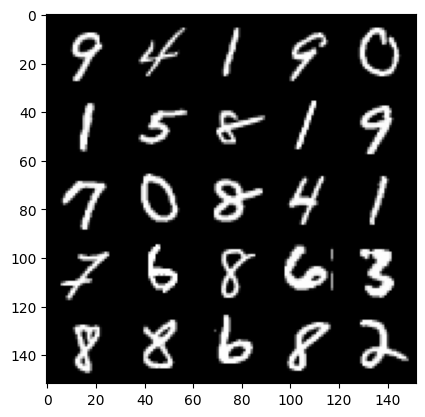

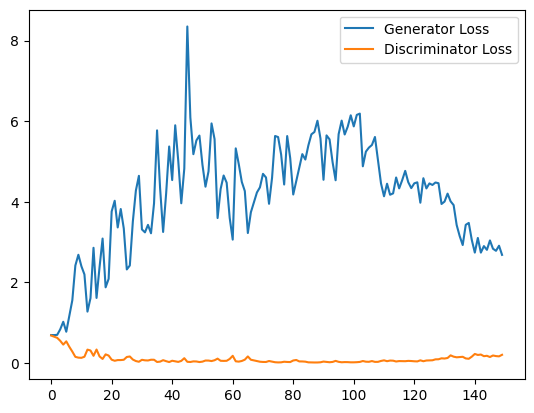

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.607557467699051, discriminator loss: 0.2500315996557474


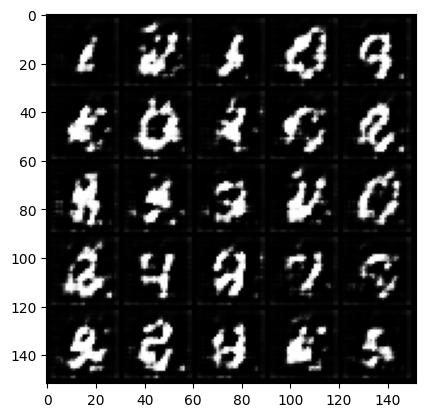

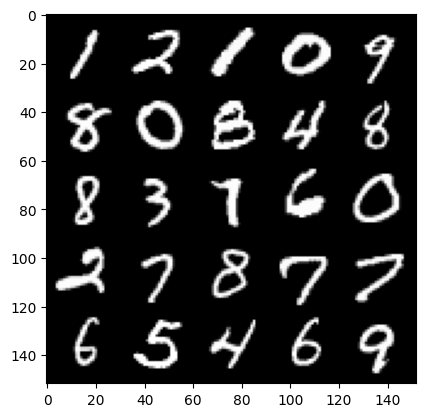

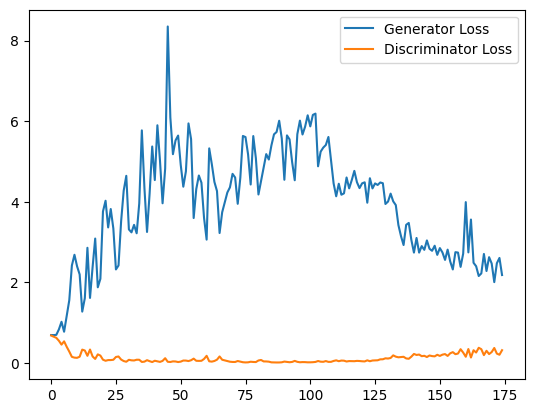

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.195169153213501, discriminator loss: 0.3255681171417236


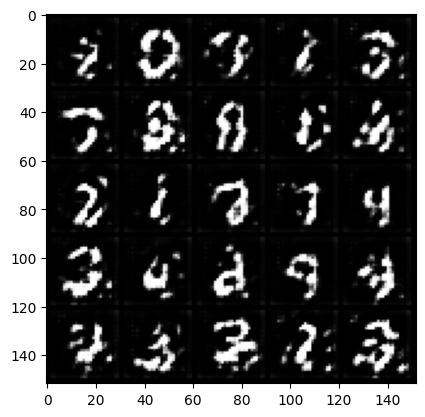

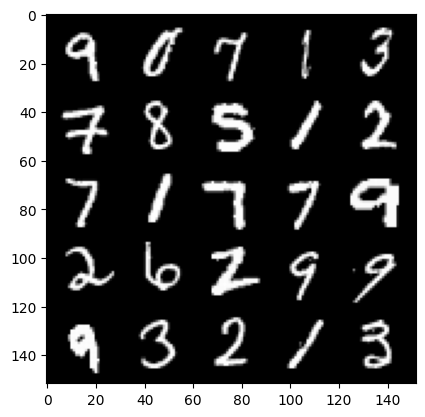

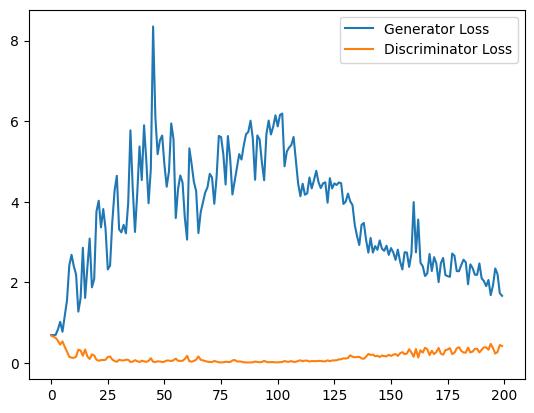

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 2.0677503263950348, discriminator loss: 0.30478264144062994


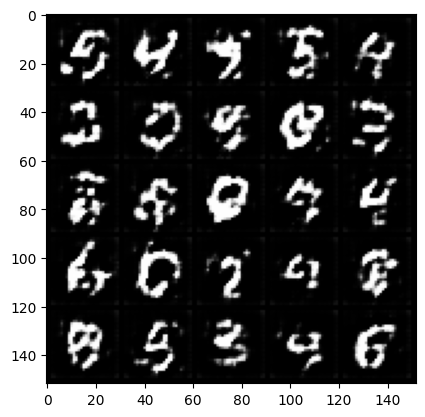

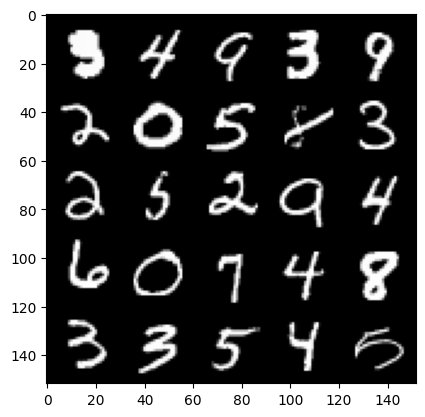

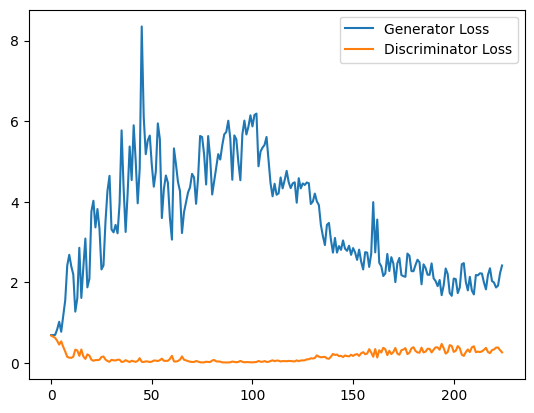

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 1.9130433330535888, discriminator loss: 0.3598443404138088


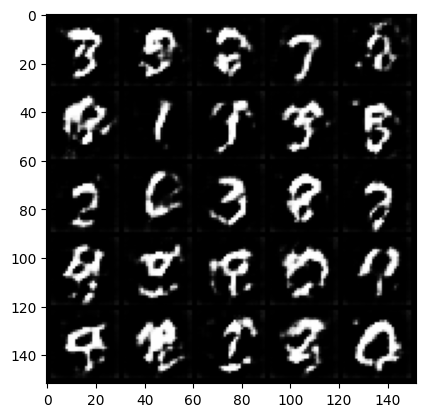

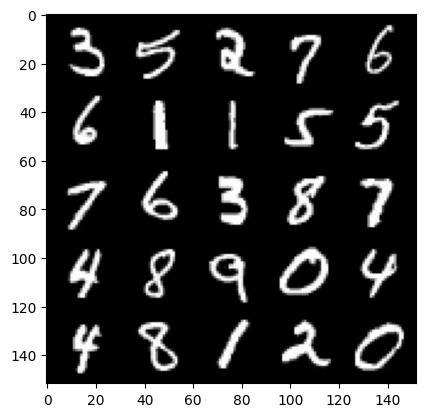

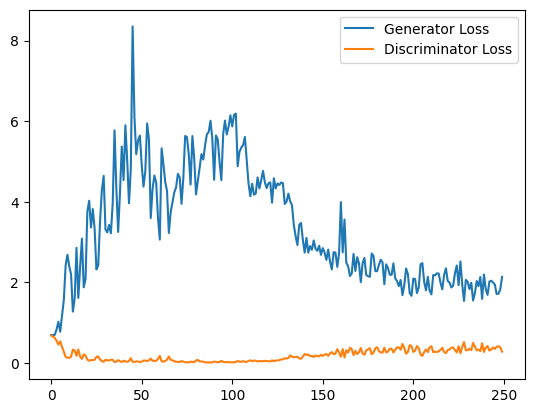

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 1.8223871207237243, discriminator loss: 0.4001888439953327


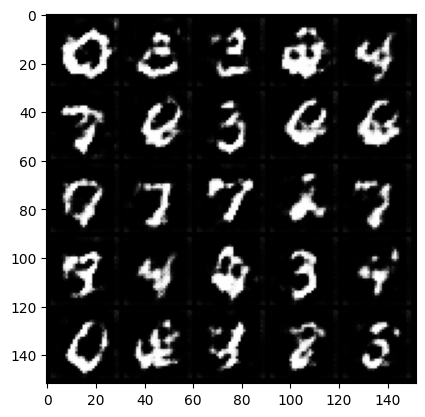

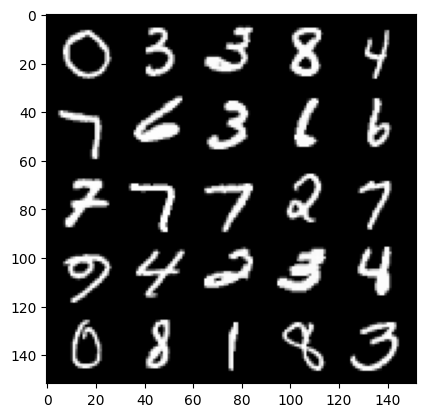

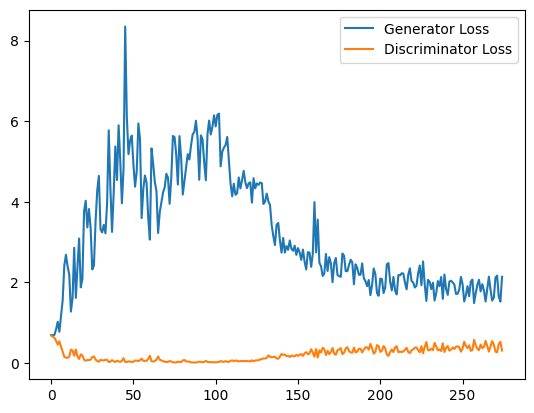

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 1.7412512929439545, discriminator loss: 0.3877793896198273


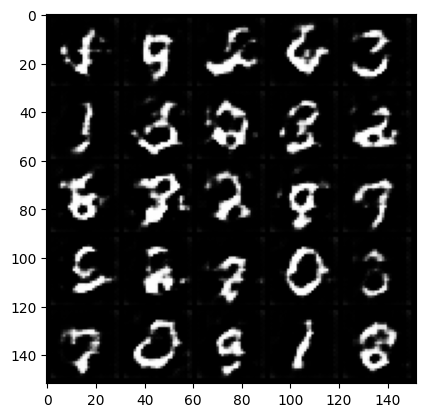

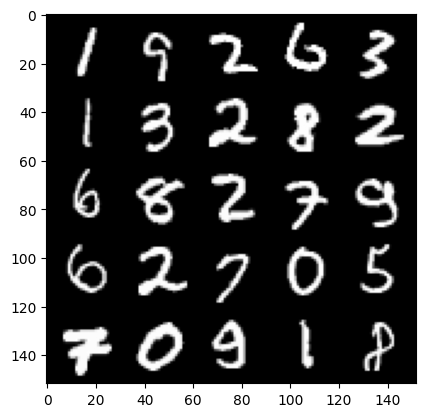

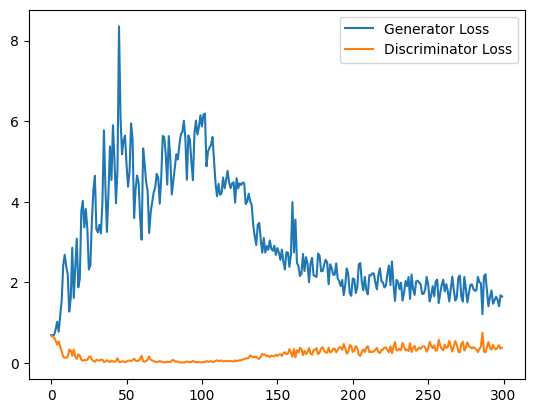

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 1.6109887828826905, discriminator loss: 0.4069041279256344


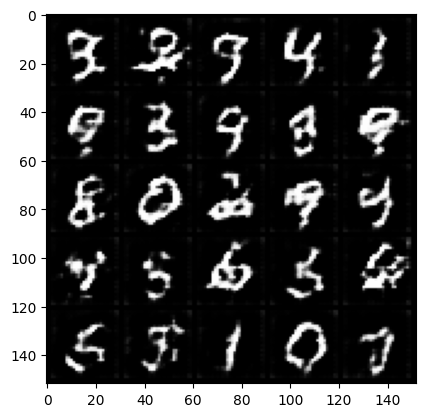

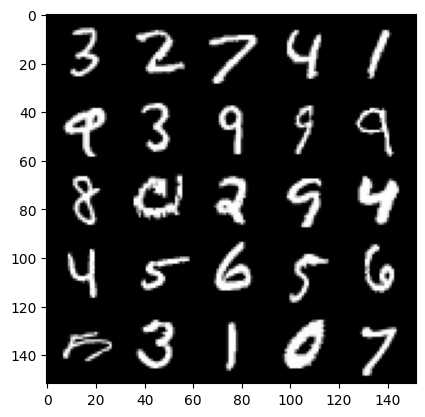

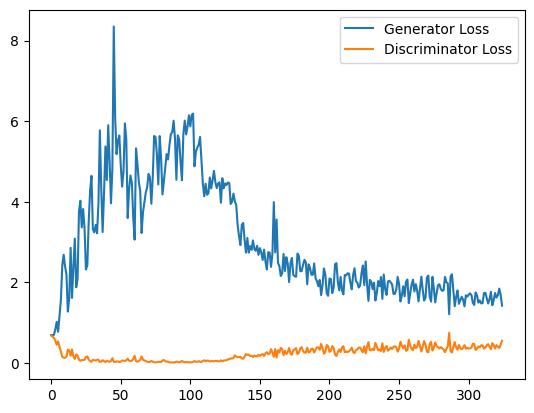

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 1.6790155758857728, discriminator loss: 0.425705275028944


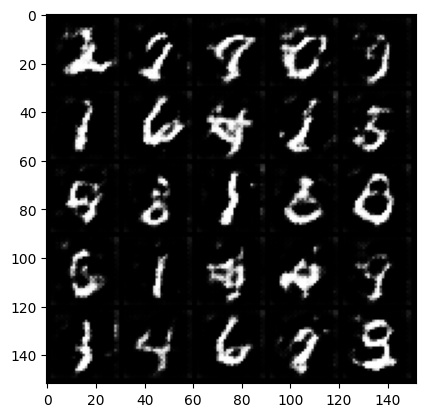

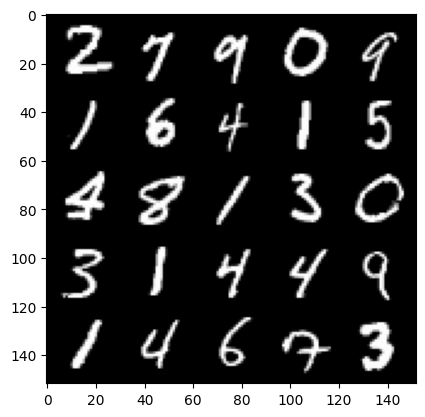

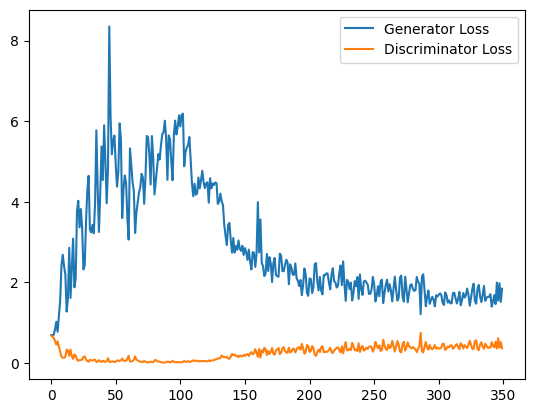

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 1.6137217252254485, discriminator loss: 0.4348969168663025


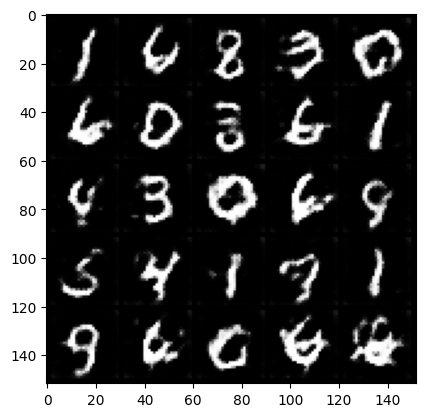

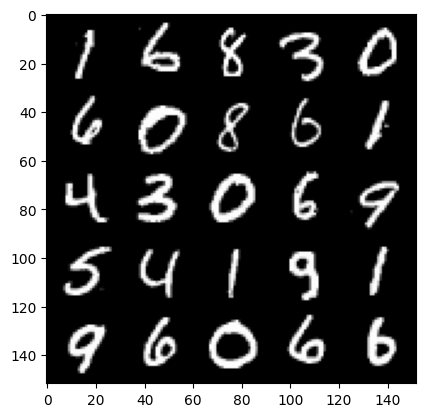

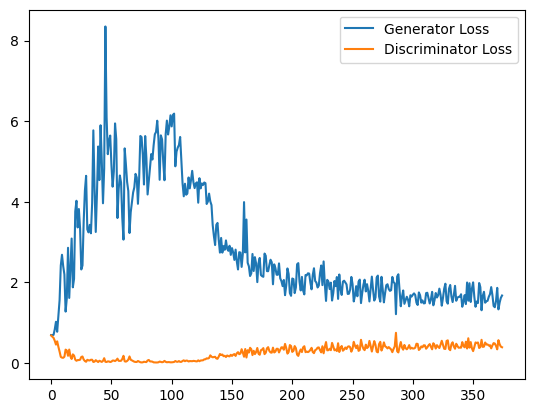

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 1.5104387065172196, discriminator loss: 0.45857720205187796


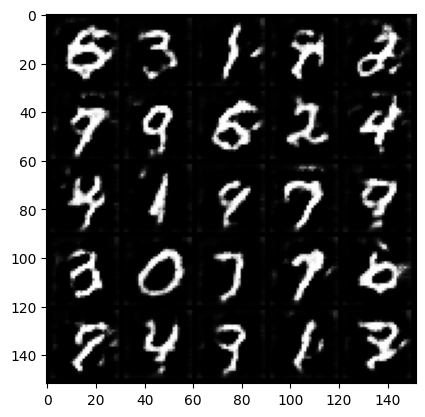

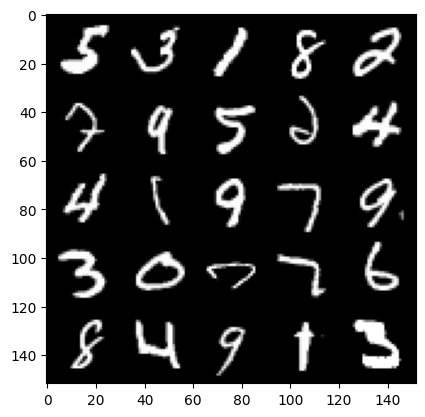

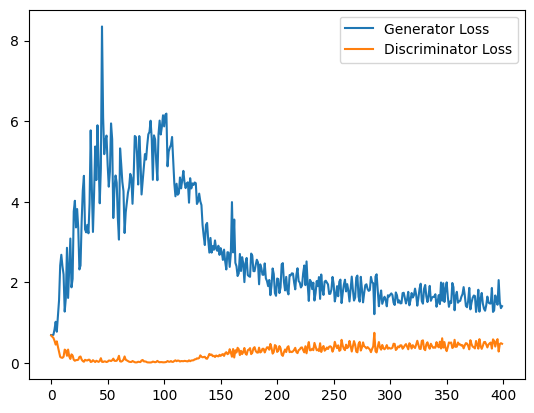

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 1.500957707643509, discriminator loss: 0.4712376058101654


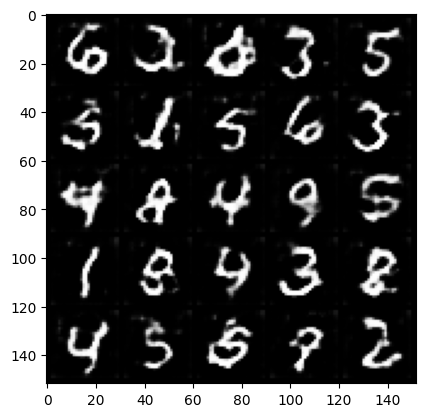

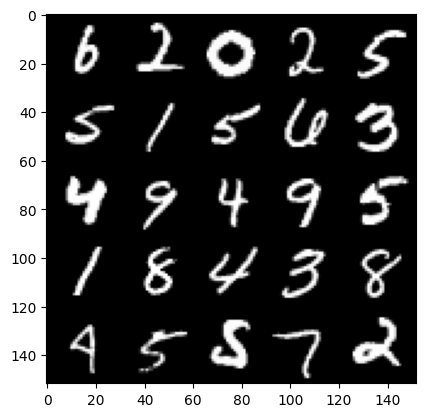

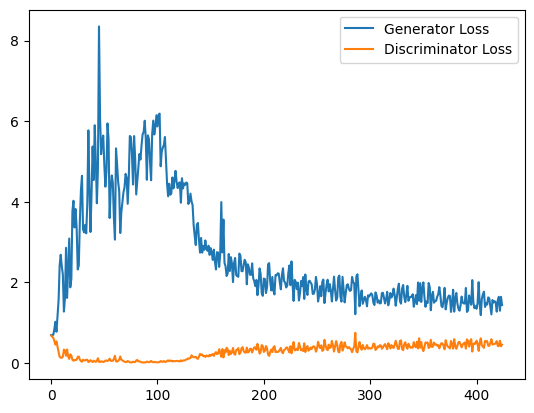

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 1.4055382475852967, discriminator loss: 0.4824479706287384


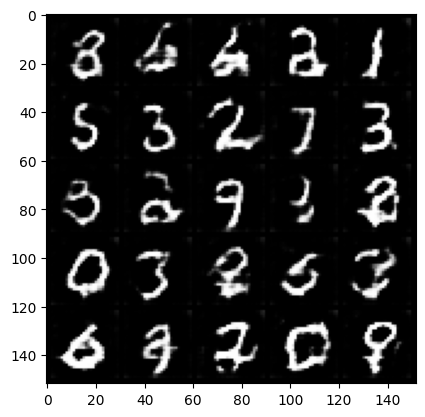

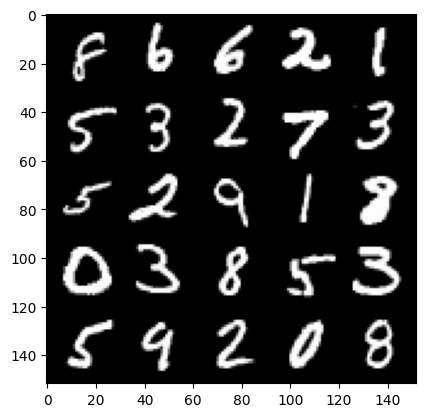

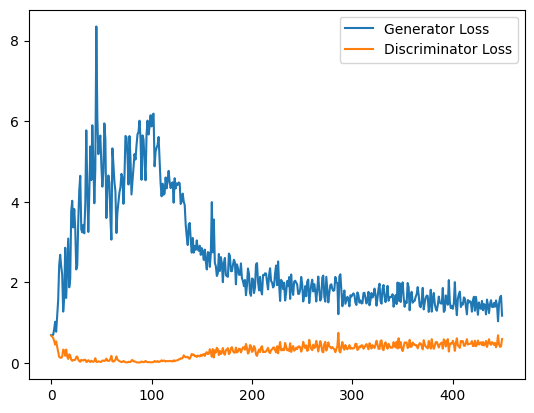

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 1.362826025724411, discriminator loss: 0.4944536697268486


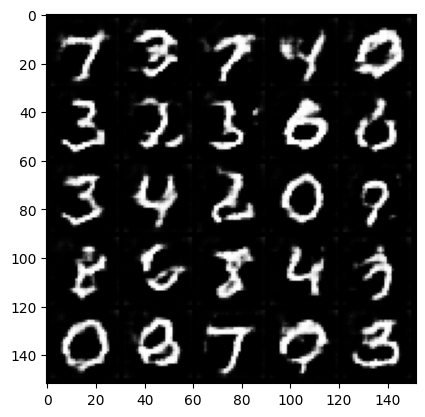

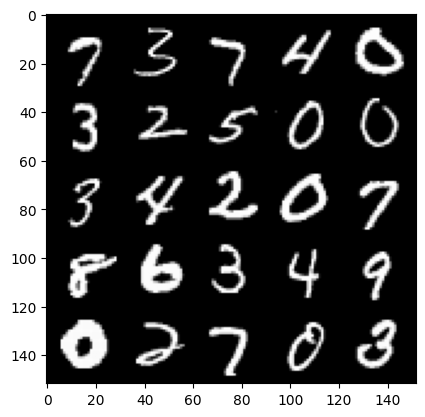

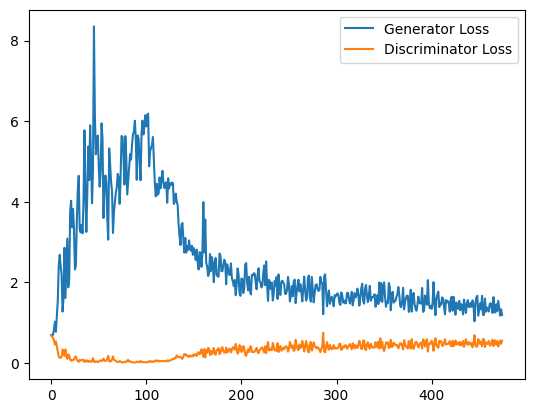

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 1.2999400495290756, discriminator loss: 0.5068594759106636


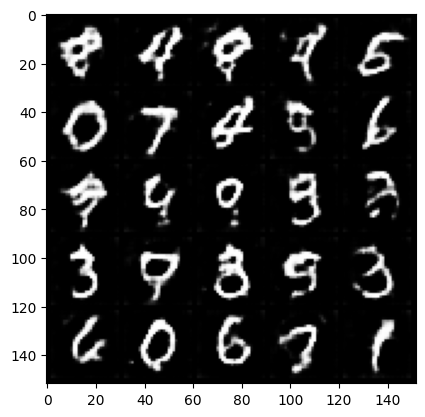

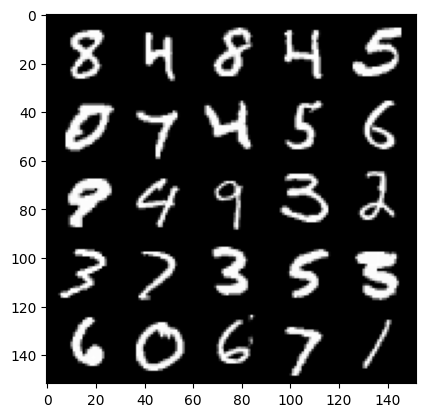

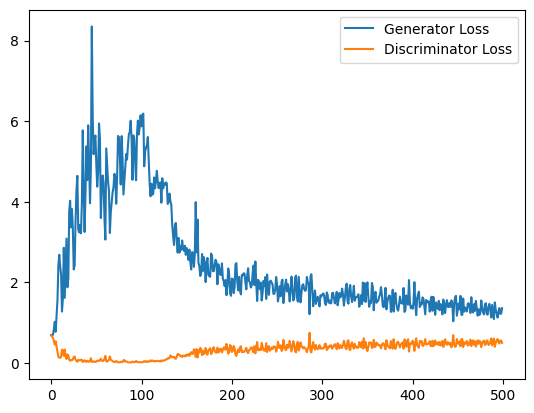

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 1.3191576837301253, discriminator loss: 0.519512332379818


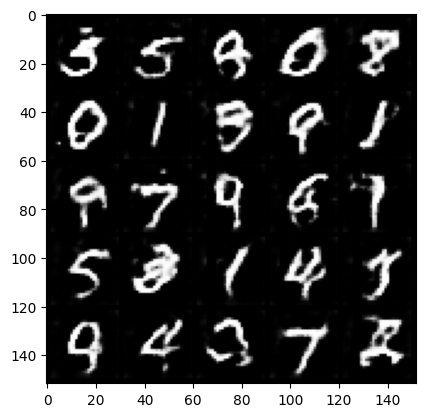

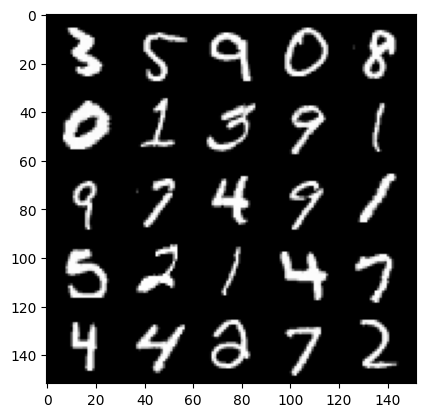

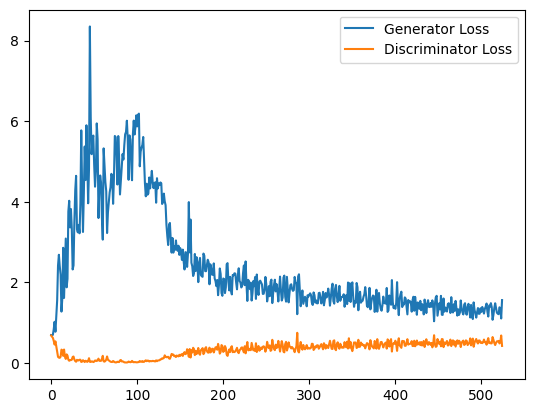

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 1.2682489397525787, discriminator loss: 0.5283220086693764


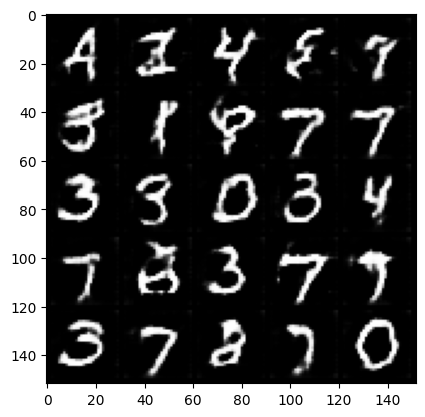

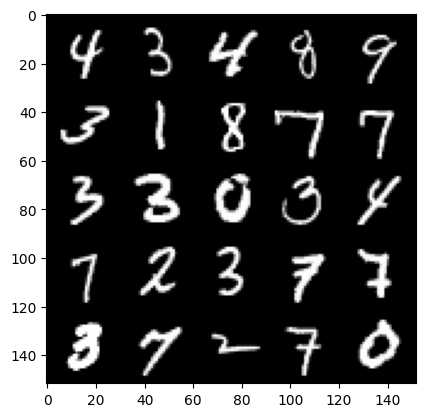

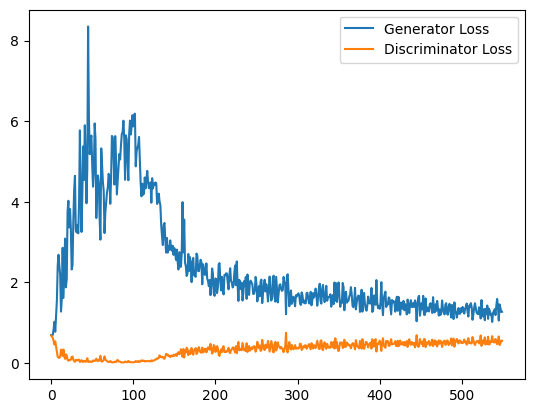

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 1.2773550938367844, discriminator loss: 0.537381303191185


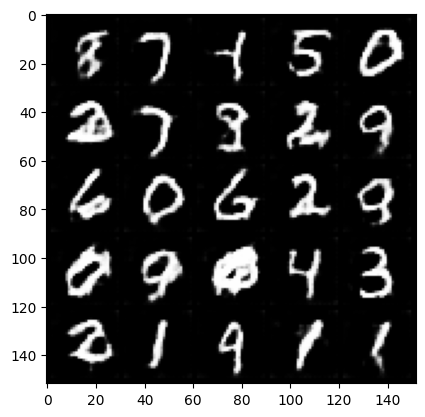

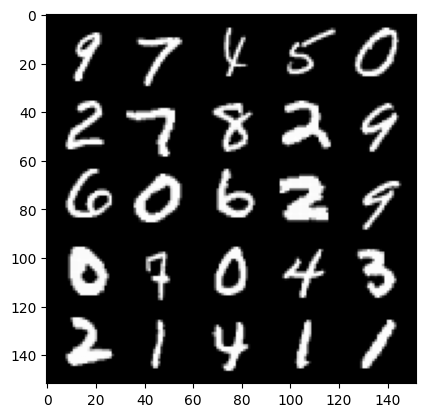

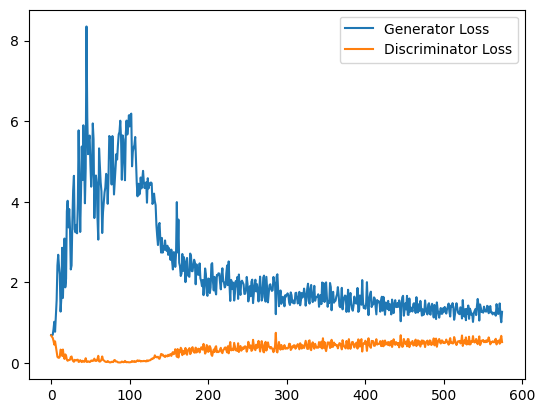

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 1.2289018112421035, discriminator loss: 0.5414979079961777


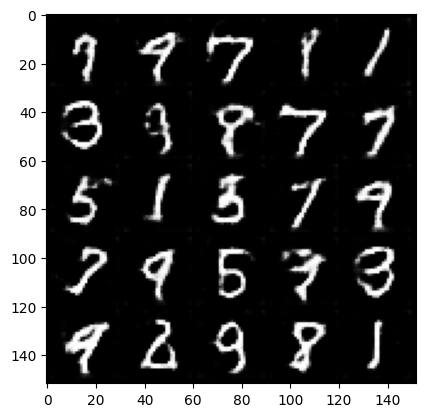

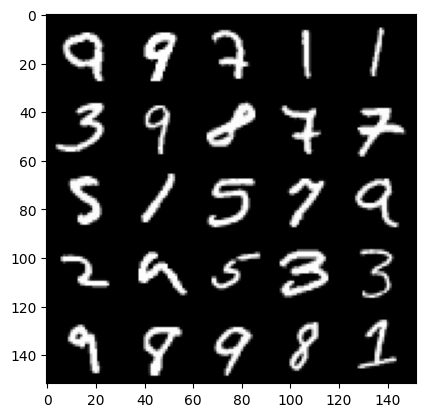

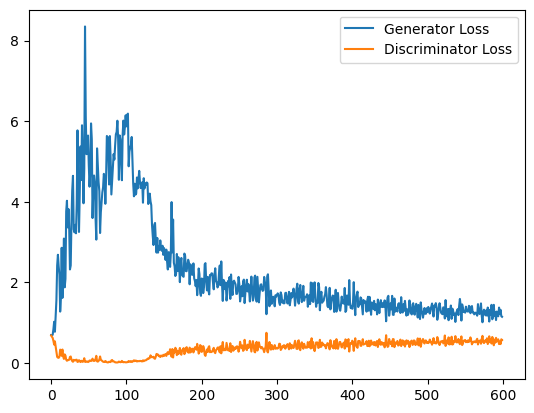

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 1.2165559451580048, discriminator loss: 0.5493224067091942


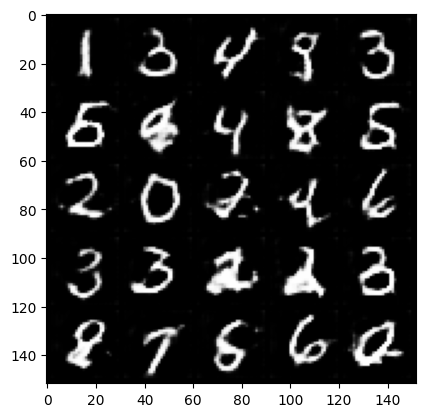

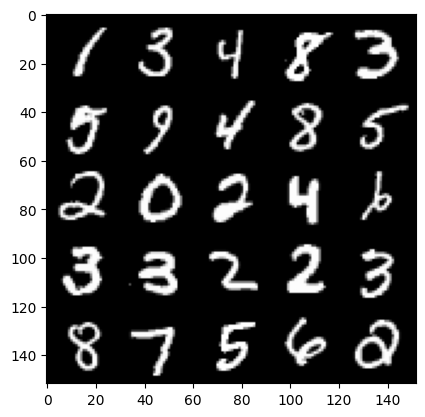

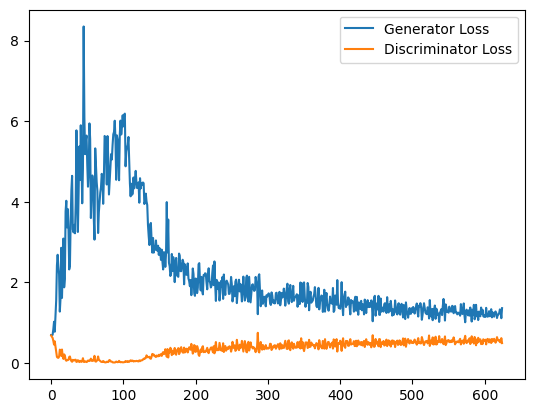

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 1.1829581464529038, discriminator loss: 0.5616189206838608


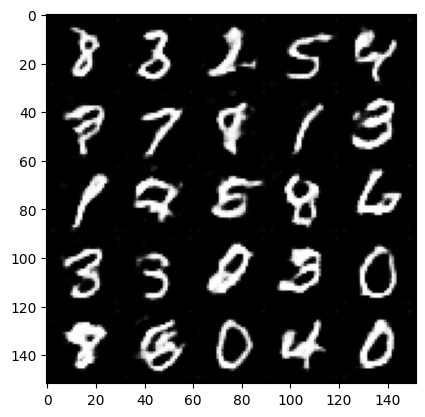

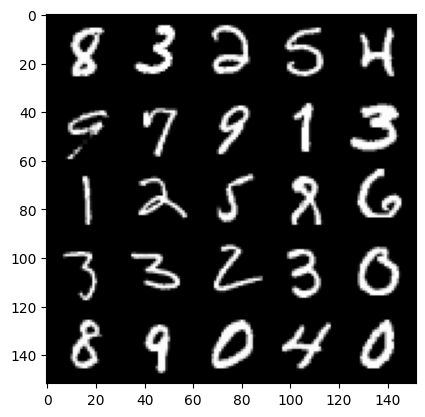

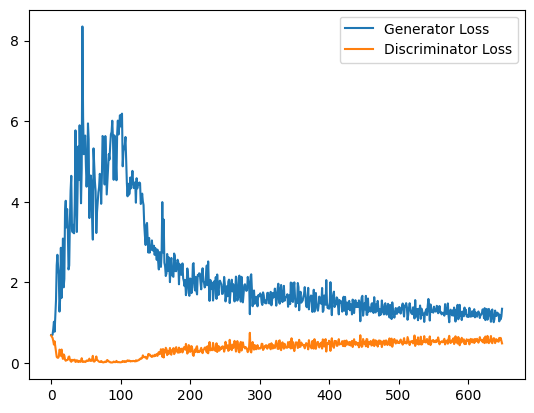

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 1.1235437811613083, discriminator loss: 0.5707085302472115


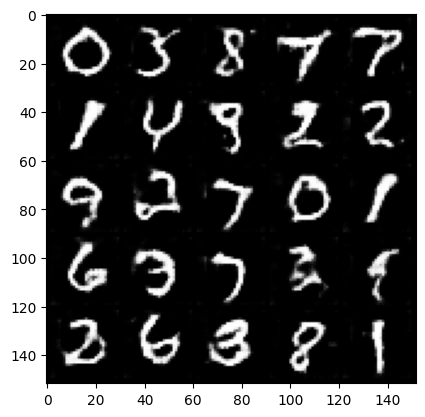

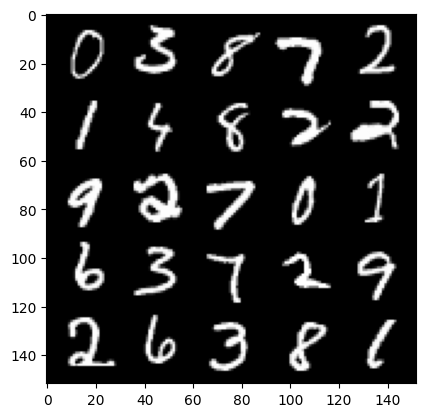

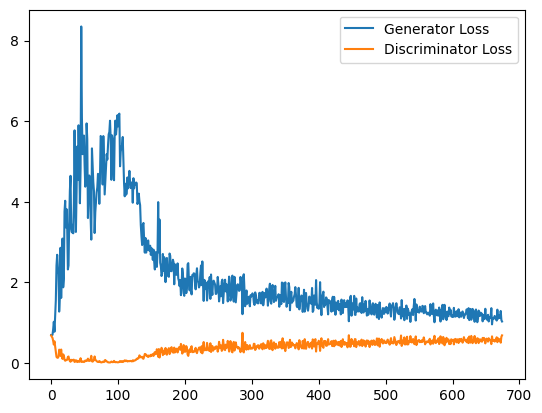

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 1.1300795518159867, discriminator loss: 0.5604001970887185


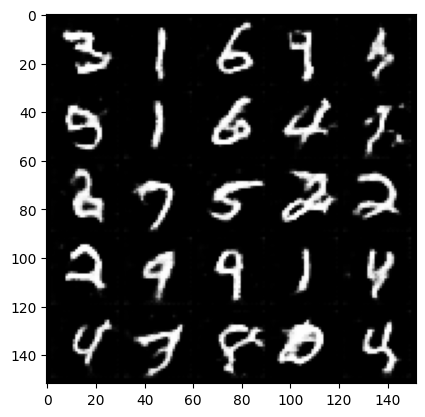

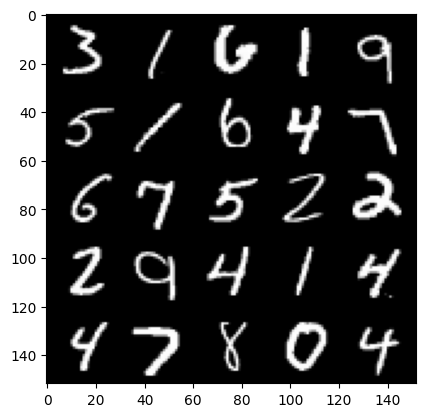

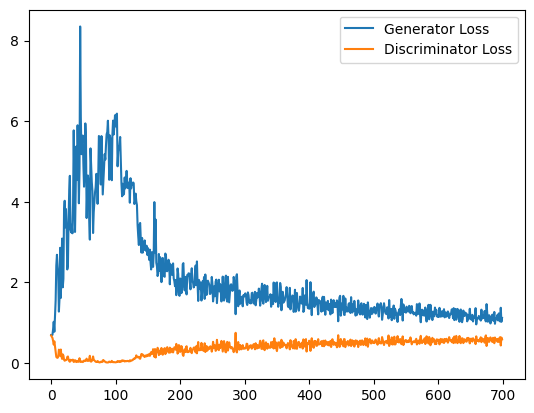

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 1.133839694261551, discriminator loss: 0.5691250707507134


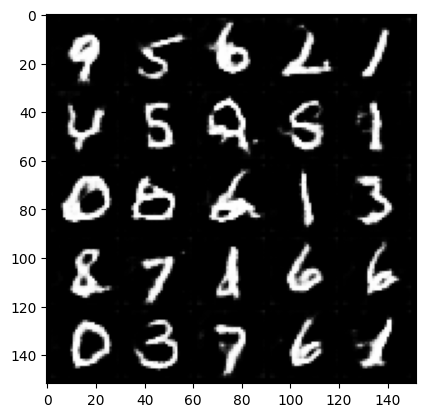

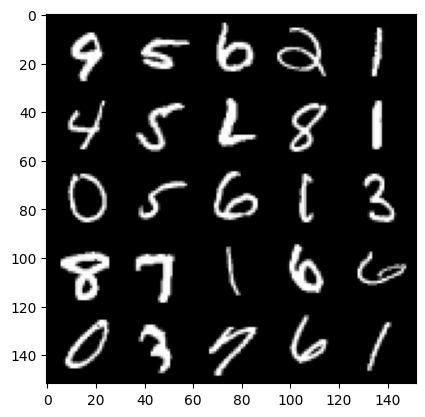

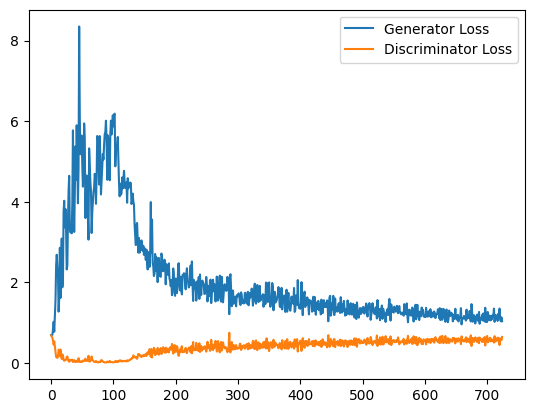

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 1.149327041745186, discriminator loss: 0.5753311597108841


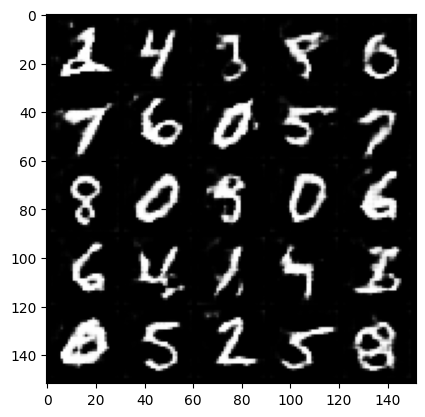

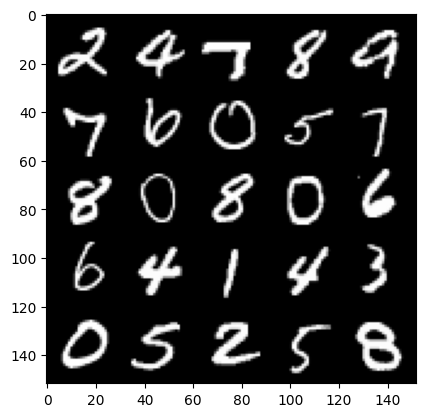

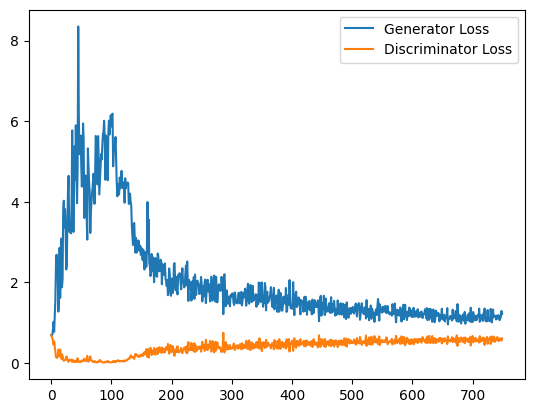

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 1.0823387489318848, discriminator loss: 0.5830793099999427


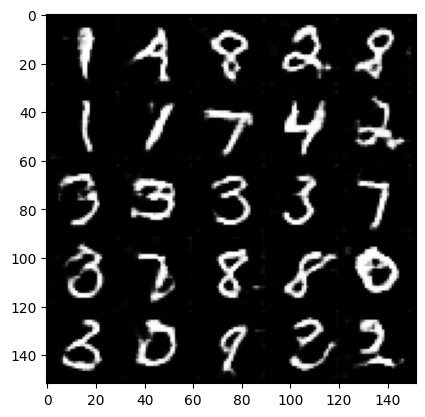

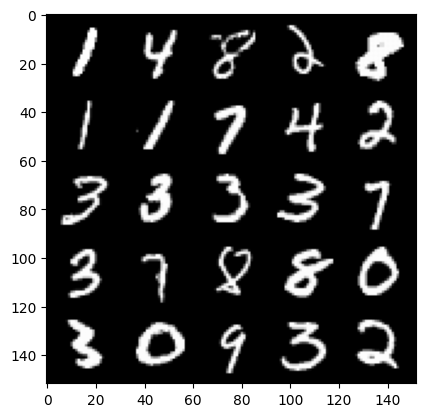

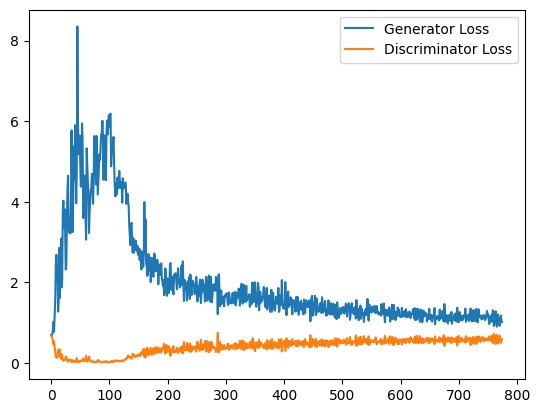

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 1.0889194483757019, discriminator loss: 0.5826829253435135


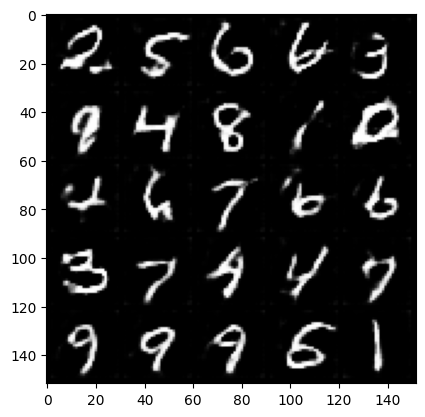

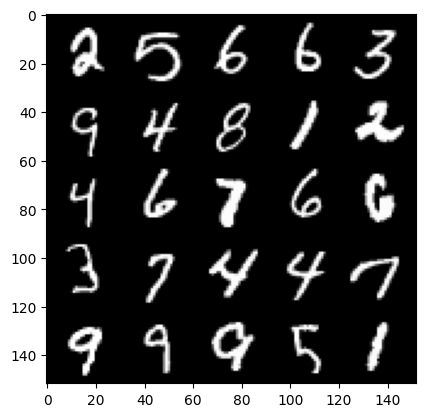

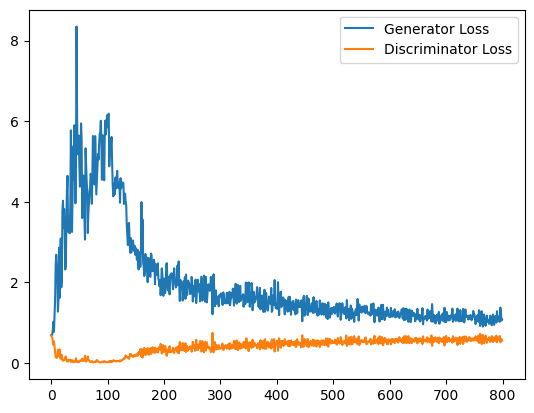

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 1.0661595804691315, discriminator loss: 0.5916564491987228


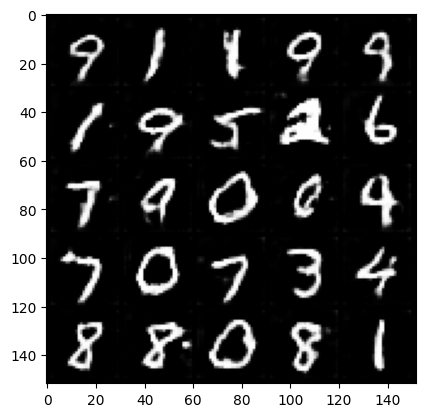

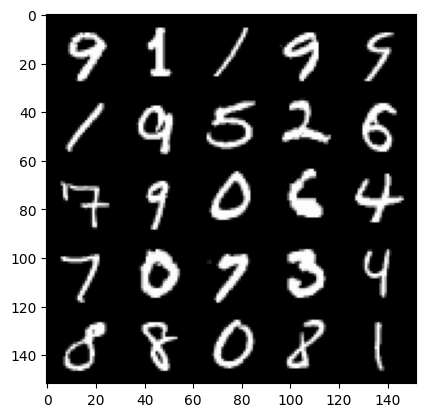

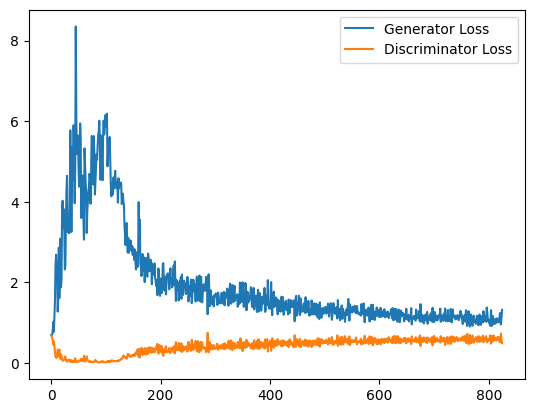

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 1.0390684140920639, discriminator loss: 0.5932859921455383


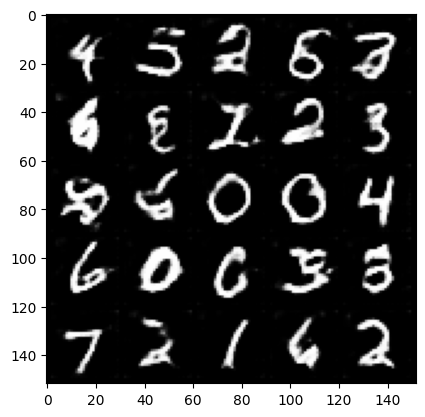

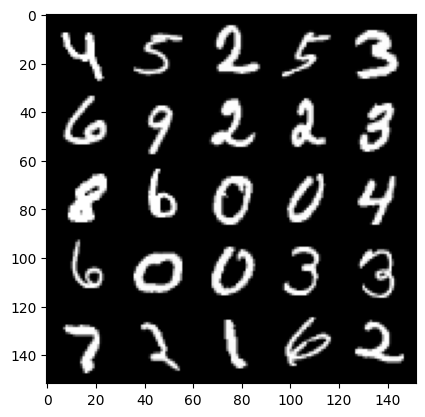

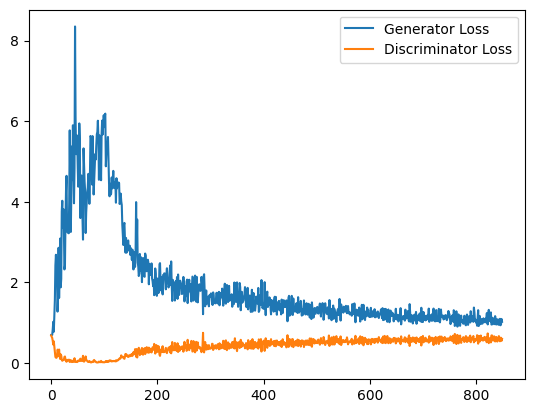

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 1.011091985464096, discriminator loss: 0.6004790515303612


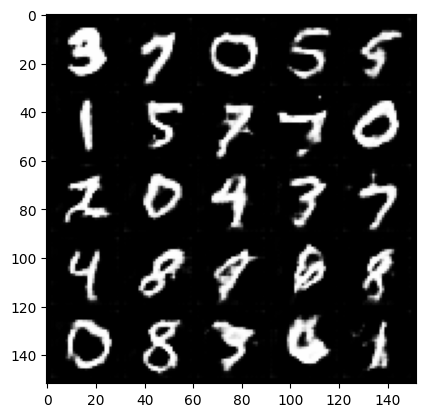

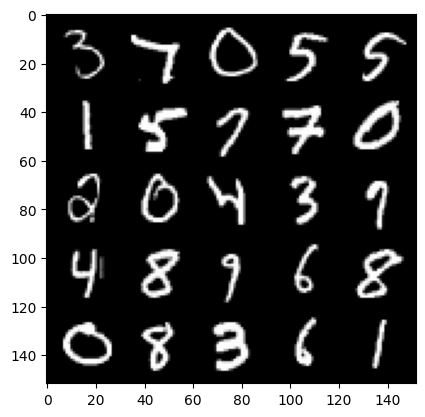

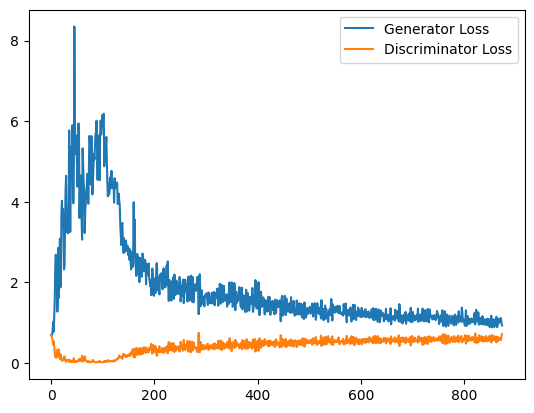

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 1.0534217602014542, discriminator loss: 0.5995781844854355


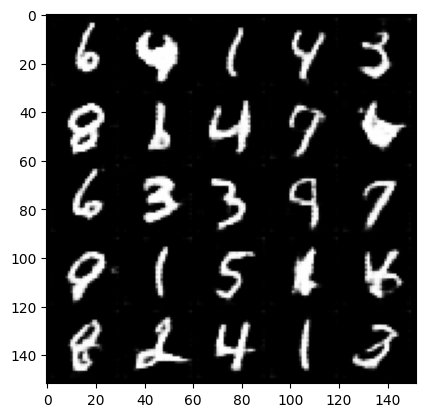

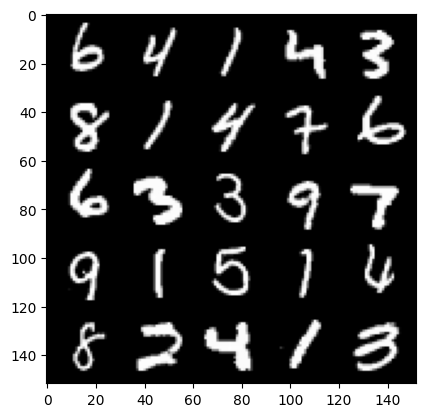

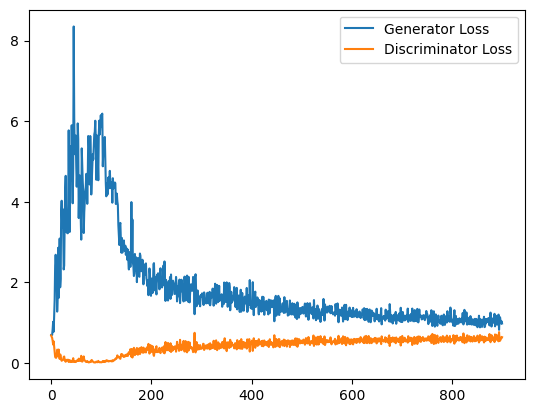

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 1.0293681898117066, discriminator loss: 0.5959794356822967


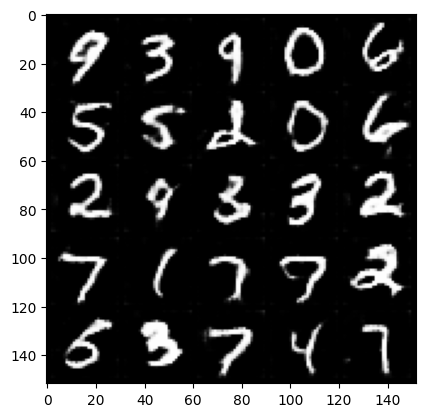

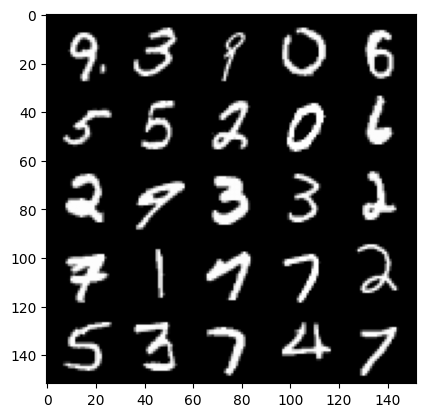

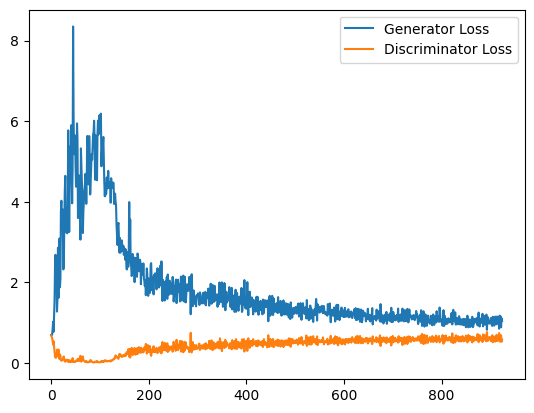

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 1.013730220913887, discriminator loss: 0.6041997634172439


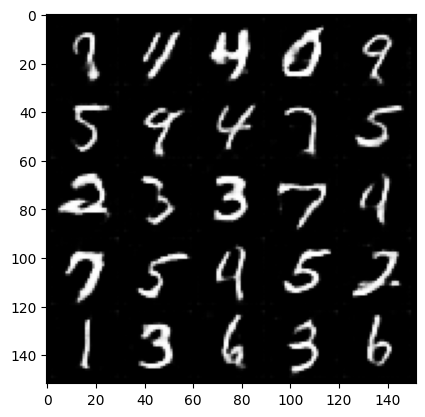

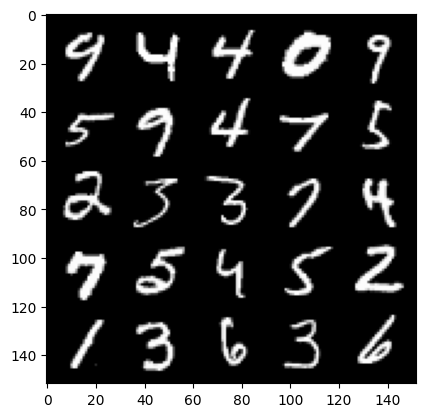

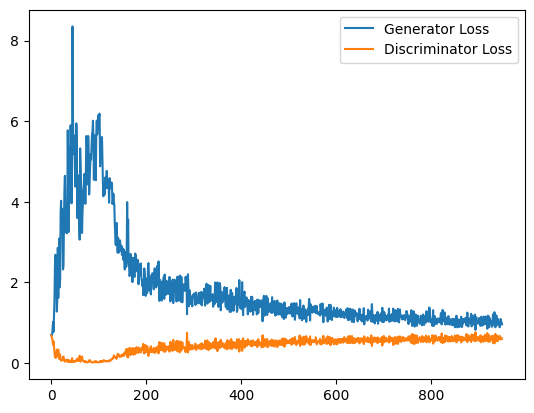

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 0.9808223270177842, discriminator loss: 0.609464353621006


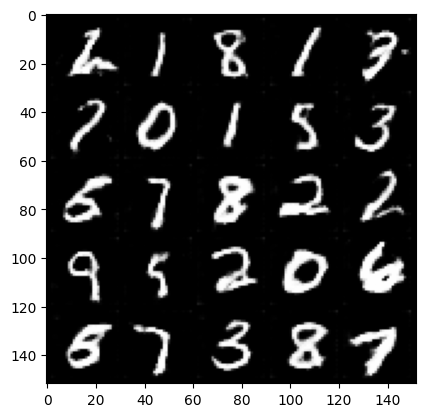

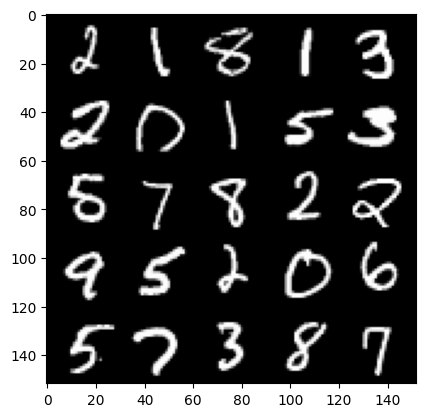

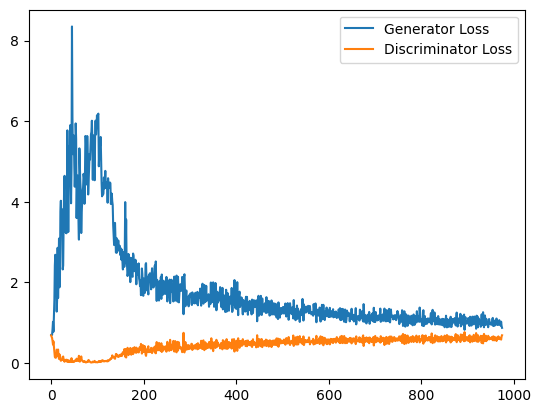

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 1.0067963951826095, discriminator loss: 0.6001265477538109


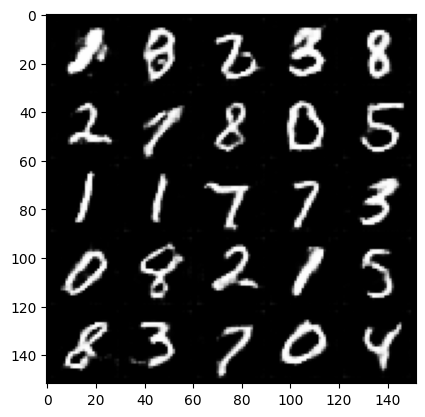

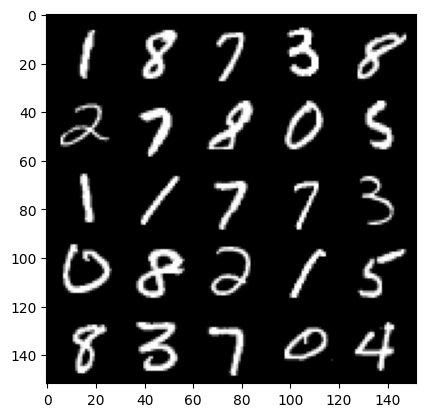

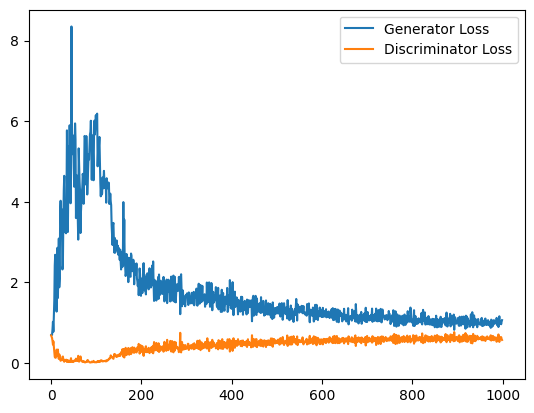

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 0.9756511906385422, discriminator loss: 0.6107347131967544


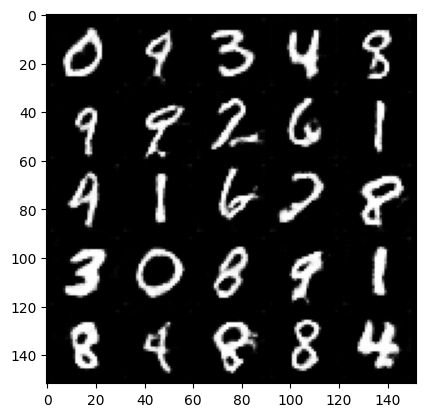

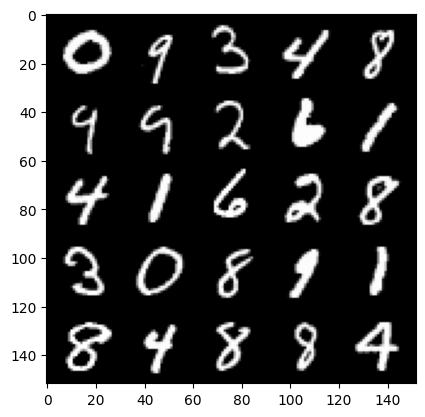

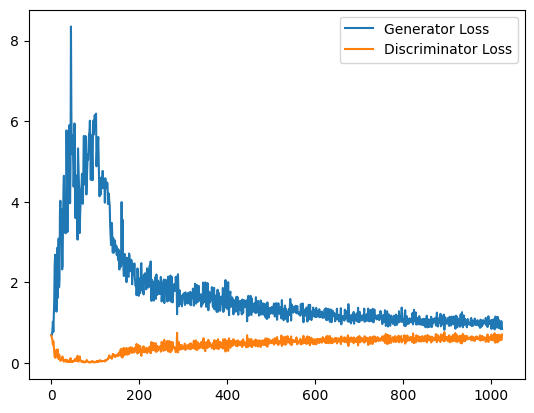

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 0.9691874173879623, discriminator loss: 0.6084434915184974


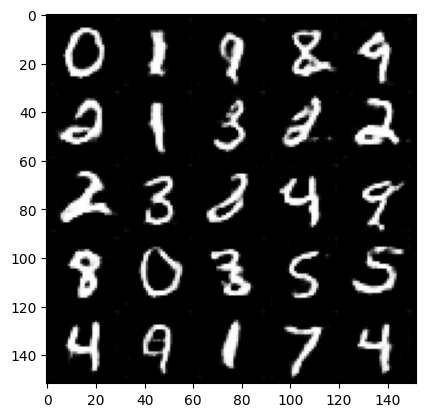

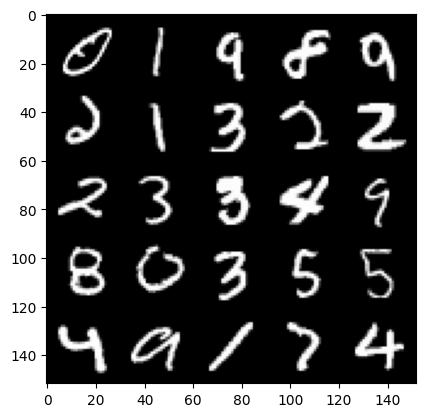

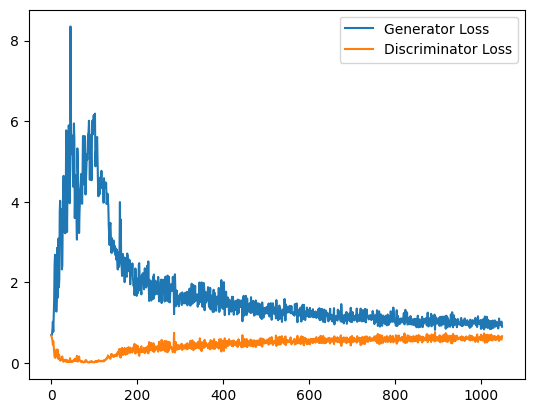

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 1.0000468968153, discriminator loss: 0.6147284804582596


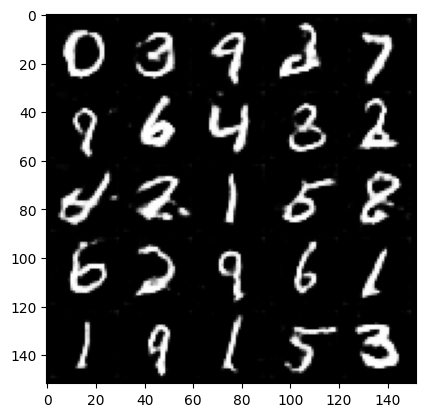

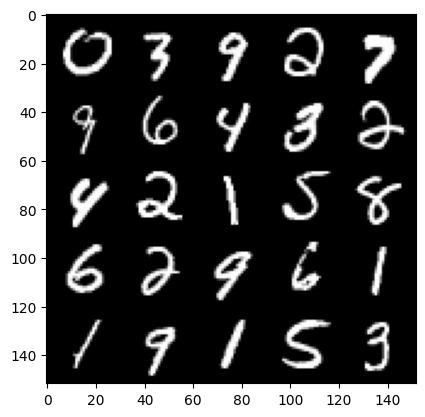

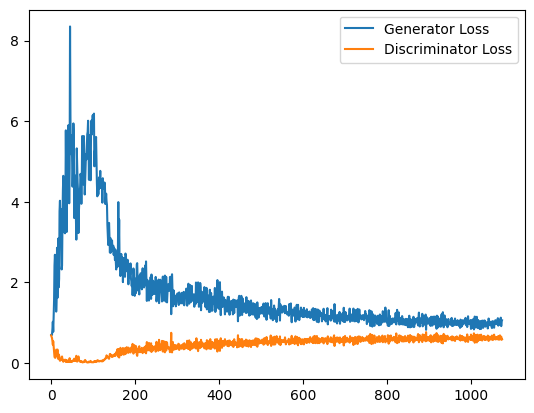

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 1.001233424425125, discriminator loss: 0.6198367592692375


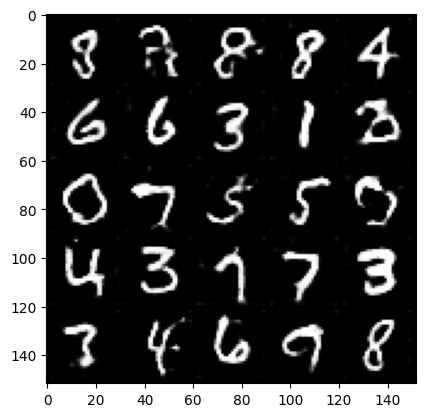

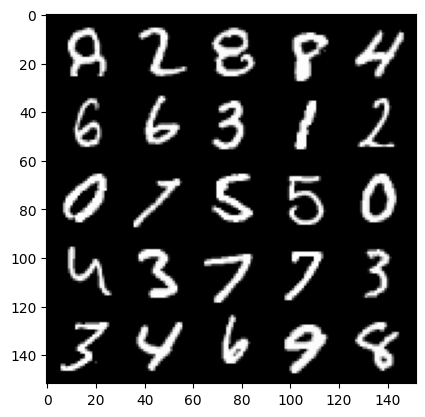

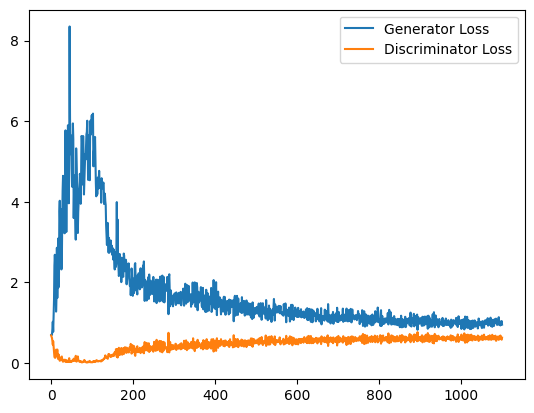

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 0.9464880036115646, discriminator loss: 0.618319131076336


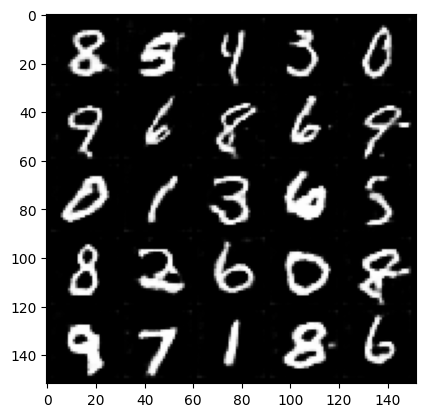

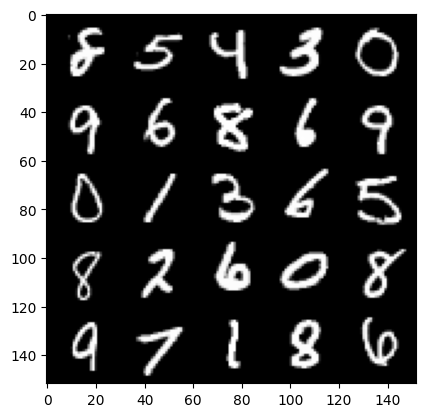

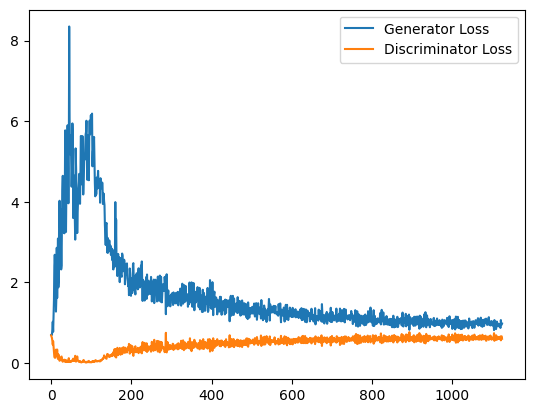

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 0.9495388379096985, discriminator loss: 0.6170105286836625


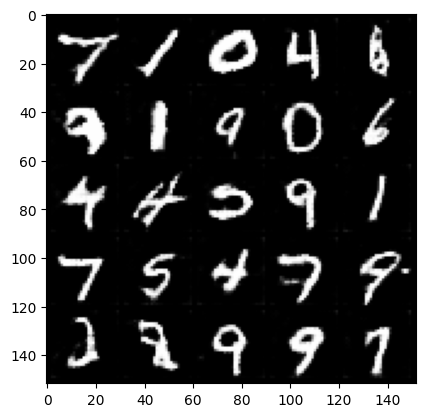

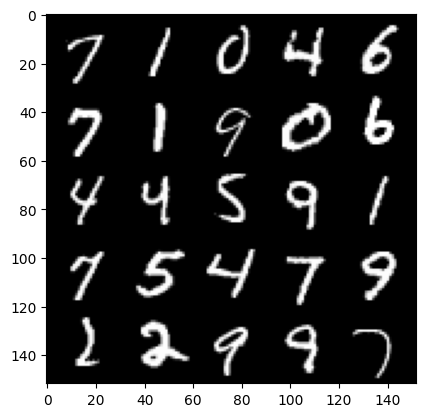

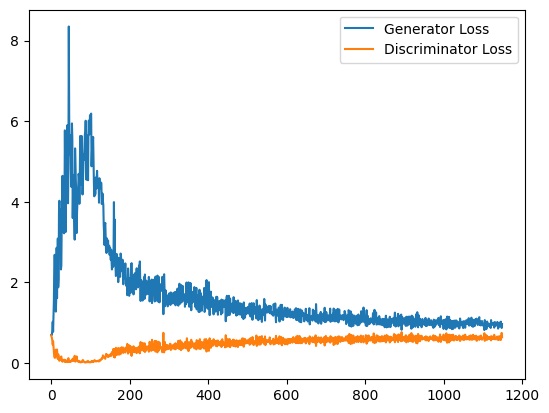

In [ ]:
cur_step = 0
generator_losses = []
discriminator_losses = []

#UNIT TEST NOTE: Initializations needed for grading
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)


        noise_and_labels = combine_vectors(fake_noise, one_hot_labels).to(device)
        fake = gen(noise_and_labels)

        # Make sure that enough images were generated
        assert len(fake) == len(real)
        # Check that correct tensors were combined
        assert tuple(noise_and_labels.shape) == (cur_batch_size, fake_noise.shape[1] + one_hot_labels.shape[1])
        # It comes from the correct generator
        assert tuple(fake.shape) == (len(real), 1, 28, 28)

        fake_image_and_labels = combine_vectors(fake.detach(), image_one_hot_labels).to(device)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels).to(device)
        disc_fake_pred = disc(fake_image_and_labels)
        disc_real_pred = disc(real_image_and_labels)


        # Make sure shapes are correct
        assert tuple(fake_image_and_labels.shape) == (len(real), fake.detach().shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        assert tuple(real_image_and_labels.shape) == (len(real), real.shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)
        # Shapes must match
        assert tuple(fake_image_and_labels.shape) == tuple(real_image_and_labels.shape)
        assert tuple(disc_fake_pred.shape) == tuple(disc_real_pred.shape)


        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels).to(device)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1

In [ ]:
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch.git

Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 131 (delta 0), reused 1 (delta 0), pack-reused 128
Receiving objects: 100% (131/131), 1.13 MiB | 20.67 MiB/s, done.
Resolving deltas: 100% (57/57), done.


In [ ]:
!pip install click requests tqdm pyspng ninja imageio-ffmpeg==0.4.3

  Using cached imageio_ffmpeg-0.4.3-py3-none-manylinux2010_x86_64.whl (26.9 MB)


In [ ]:
!python stylegan2-ada-pytorch/generate.py --outdir=out --trunc=1 --seeds=85,265,297,849 \
    --network=https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metfaces.pkl

Loading networks from "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metfaces.pkl"...
Generating image for seed 85 (0/4) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 265 (1/4) ...
Generating image for seed 297 (2/4) ...
Generating image for seed 849 (3/4) ...


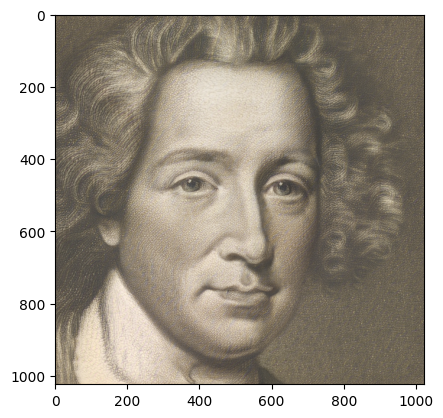

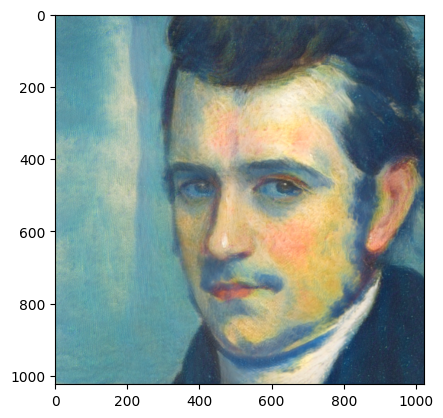

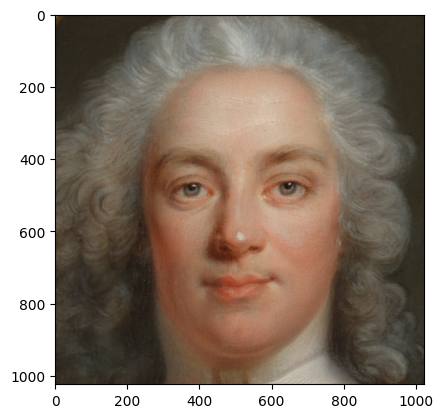

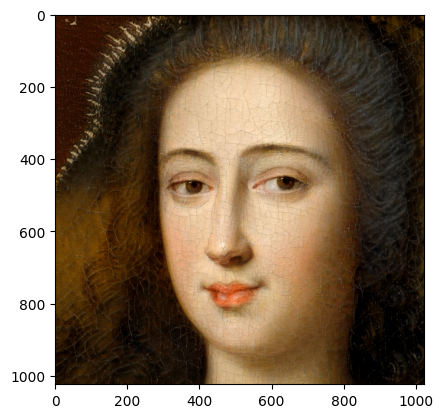

In [ ]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt

out_path = Path('out')
for img_path in out_path.iterdir():
    plt.figure()
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)

In [ ]:
img = cv2.imread('gratis-png-shrek.png')
img = cv2.resize(img, (1024, 1024))
cv2.imwrite('target.png', img)

True

In [ ]:
!python stylegan2-ada-pytorch/projector.py --outdir=out_2 --target=target.png \
    --network=https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl

Loading networks from "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl"...
Computing W midpoint and stddev using 10000 samples...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
step    1/1000: dist 0.82 loss 24567.48
step    2/1000: dist 0.85 loss 27640.82
step    3/1000: dist 0.77 loss 27166.89
step    4/1000: dist 0.77 loss 26253.57
step    5/1000: dist 0.76 loss 24957.38
step    6/1000: dist 0.80 loss 23352.34
step    7/1000: dist 0.77 loss 21510.93
step    8/1000: dist 0.74 loss 19487.01
step    9/1000: dist 0.75 loss 17341.69
step   10/1000: dist 0.74 loss 15140.52
step   11/1000: dist 0.73 loss 12947.24
step   12/1000: dist 0.72 loss 10818.29
step   13/1000: dist 0.73 loss 8801.44
step   14/1000: dist 0.71 loss 6946.75
step   15/1000: dist 0.71 loss 5314.01
step   16/1000: dist 0.69 loss 3971.78
step   17/1000: dist 0.69 loss 2942.70
step   18/1000: dist 0.67 loss 2211.10
step   19/1000: dist 0